<a href="https://colab.research.google.com/github/LamNg99/Dog-Breed-Classifier/blob/main/dog_breed_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 Using Transfer Learning and TensorFlow 2.0 to Classify Different Dog Breeds

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

It's multi-class because we're trying to classify mutliple different breeds of dog. If we were only trying to classify dogs versus cats, it would be called binary classification (one thing versus another).

Multi-class image classification is an important problem since it's the same kind of technology Tesla uses in their self-driving cars or Airbnb uses in atuomatically adding information to their listings.

## 1. Problem

In this project we're going to be using machine learning to help us identify different breeds of dogs.


## 2. Data

To do this, we'll be using data from the [Kaggle dog breed identification competition](https://www.kaggle.com/competitions/dog-breed-identification/data).

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
# Unzip the uploaded data into Google Drive
# !unzip '/content/drive/MyDrive/Dog Breeds Data/dog-breed-identification.zip' -d '/content/drive/MyDrive/Dog Breeds Data'

## Get our workspace ready


In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check for GPU availability
print('GPU', 'is available ^^' if tf.config.list_physical_devices('GPU') else 'is not available :((')

TF version: 2.9.2
TF Hub version: 0.12.0
GPU is not available :((


In [ ]:
# Regular EDA (exploratory data analysis) and plotting libraries
from scipy.stats import norm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread

import seaborn as sns

# Image Display
from IPython.display import Image

## Getting data ready


In [ ]:
# Accessing data and checking labels
labels_csv = pd.read_csv('drive/MyDrive/Dog Breeds Data/labels.csv')
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


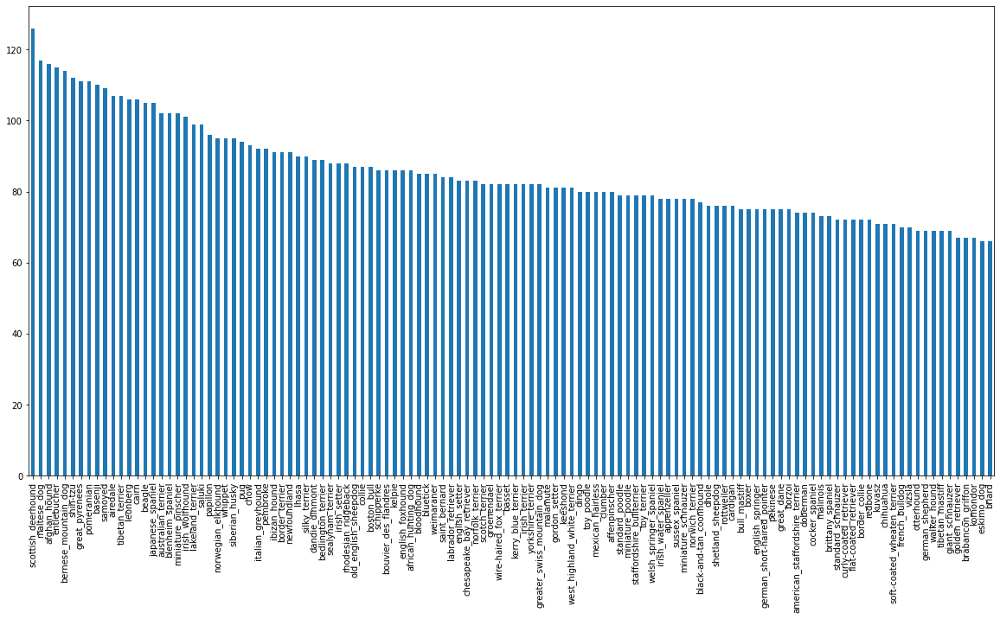

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10));

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

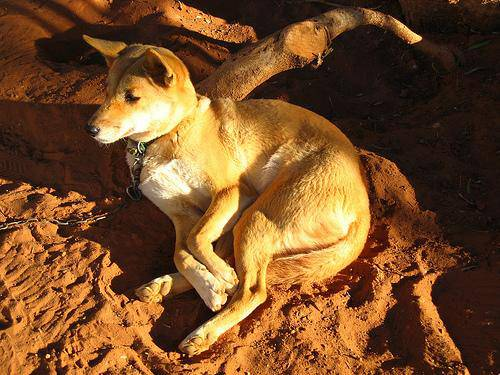

In [ ]:
Image('drive/MyDrive/Dog Breeds Data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their labels





In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from images from image ID's
filenames = ['drive/MyDrive/Dog Breeds Data/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]

print(len(filenames))

10222


In [ ]:
# Check whether of filenames matches number of actual image files
import os 
if len(os.listdir('drive/MyDrive/Dog Breeds Data/train/')) == len(filenames):
  print('Match, you can proceed with next step!')
else:
  print('Do not match, please check again!')

Match, you can proceed with next step!


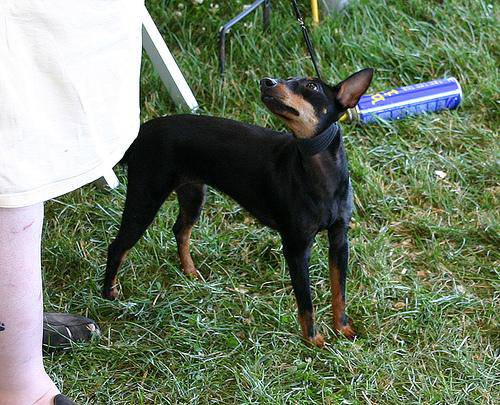

In [ ]:
# One more check
Image(filenames[3333])

In [ ]:
labels_csv['breed'][3333]

'toy_terrier'

In [ ]:
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Match!')
else:
  print('Do not match! :((')

Match!


In [ ]:
from pandas.core.algorithms import unique
# Fund the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels]

In [ ]:
len(boolean_labels)

10222

### Creating validation set 

The dataset from Kaggle does not come with validation set.

In [ ]:
# Setup X & y variables 
X = filenames 
y = boolean_labels 

Start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
from pandas.core.common import random_state
# Split data into train and validation sets
from sklearn.model_selection import train_test_split

# Split into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

## Prepocessing Images

1. Take an image filepath as input 
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape (224, 224)
6. Return the modified `image`

In [ ]:
# Convert image to NumPy array
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# Define image size 
IMG_SIZE = 224 

# Function for preprocessing images
def process_image(image_path):
  '''
  Takes an image file path and turns the image into a Tensor.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desires value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning data into batches

Why turn data into batches?

Trying to process 10,000+ in one go ... they all might not fit into memory.

In order to use TensorFlow effectively, the data should be in the form of Tensor tuples: `(image, label)`

In [ ]:
# Function to retunr a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Take an image file path name and the assosciated label, 
  process the image and return a tuple of (image, label)
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
from tensorflow.python.data.ops.dataset_ops import Dataset
# Define the batch size 
BATCH_SIZE = 32

# Function a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  '''
  if test_data:
    print('Creating test data batches')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print('Creating validation data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # file labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches')
    # Turns filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Suffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches
Creating validation data batches


In [ ]:
# Check the different attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
# Create a function for viewing images in data batch
def show_batch_images(images, labels):
  '''
  Displays a plot of 32 images and their labels from a data batch
  '''
  # Setup the figure
  plt.figure(figsize=(8, 16))
  # Loop through 32 images
  for i in range(32):
    ax = plt.subplot(8, 4, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[9.20771509e-02, 3.95911522e-02, 5.80263417e-03],
          [1.01447143e-01, 6.41281605e-02, 3.72724086e-02],
          [6.40056059e-02, 5.28711528e-02, 3.35784368e-02],
          ...,
          [4.72384930e-01, 2.77076691e-01, 3.20970863e-01],
          [3.98214430e-01, 2.61782527e-01, 2.76278257e-01],
          [5.02817690e-01, 3.85621011e-01, 3.93464148e-01]],
 
         [[7.78509900e-02, 3.32196951e-02, 2.48068012e-04],
          [6.22373968e-02, 3.27906162e-02, 2.41596624e-03],
          [5.47067262e-02, 4.35722731e-02, 2.42795590e-02],
          ...,
          [3.78978908e-01, 2.38870263e-01, 2.55712062e-01],
          [4.20982629e-01, 3.03825587e-01, 3.11817646e-01],
          [4.89352643e-01, 3.79432261e-01, 3.85924369e-01]],
 
         [[6.90974817e-02, 4.40058857e-02, 3.75728402e-03],
          [3.45413201e-02, 1.96025297e-02, 0.00000000e+00],
          [4.07198817e-02, 4.10028100e-02, 1.96078438e-02],
          ...,
          [3.56922835e-01, 2.85126567e-01, 2.6530

In [ ]:
len(train_images), len(train_labels)

(32, 32)

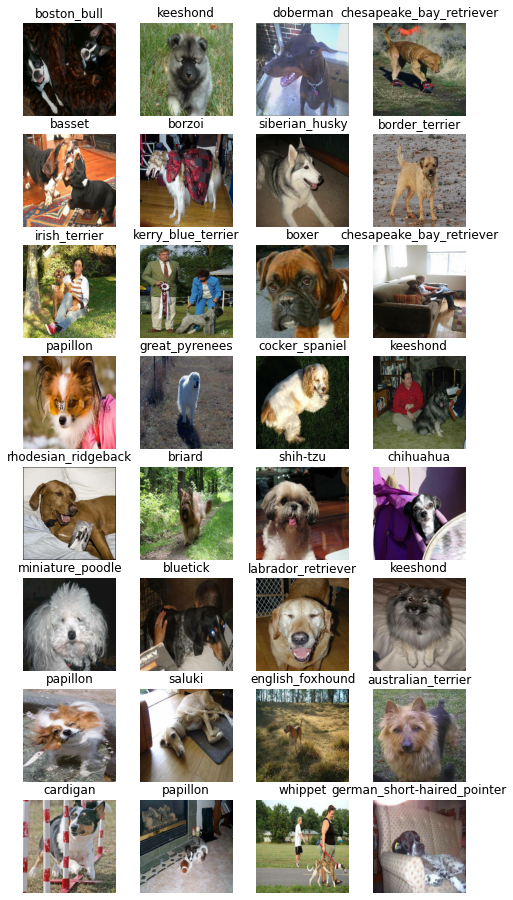

In [ ]:
# Visualize the data in a training batch
show_batch_images(train_images, train_labels)

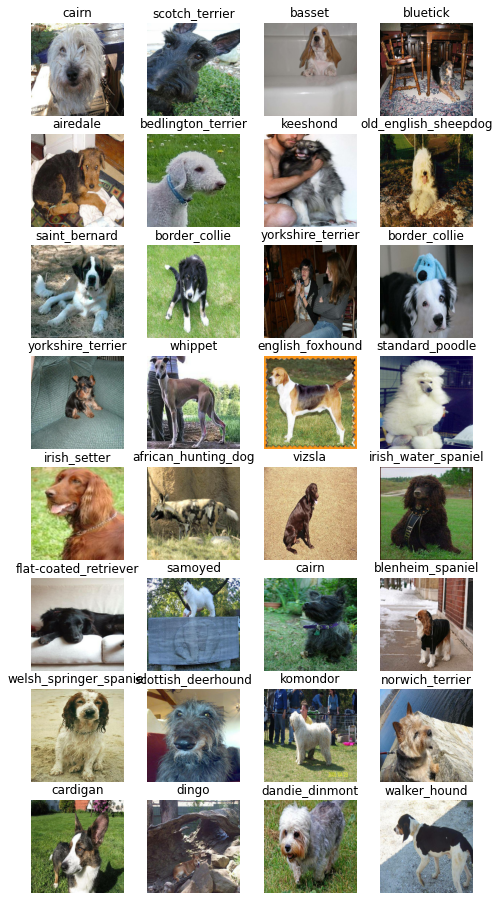

In [ ]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_batch_images(val_images, val_labels)

## Building a Model

Preprequsites:

* The input shape (images, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the [model](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5) we want to use from TensorFlow Hub.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

There are many ways of building a model in TensorFlow but one of the best ways to get started is to use the [Keras API](https://www.tensorflow.org/guide/keras/sequential_model).



Let's create a function which:

* Takes the input shape, output shape and the model we've chosen's URL as parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
* Returns the model.


In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation='softmax')]) # Layer 2 (output layer)
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), 
      optimizer=tf.keras.optimizers.Adam(), 
      metrics=["accuracy"] 
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Create callbacks

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to buld a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Dog Breeds Data/logs', 
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

In [ ]:
# Create early stopping callback
early_stopping =tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                 patience=3)

## Training a model (on subset of data)

Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

We do this to make sure everything is working. And if it is, we can step it up later and train on the entire training dataset.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check again if GPU is available 
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


In [ ]:
# Build the finction to train and return a trained model
def train_model():
  '''
  Trains a given model and return the trained version.
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 378s 15s/step - loss: 4.4342 - accuracy: 0.1000 - val_loss: 3.1763 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 155ms/step - loss: 1.5609 - accuracy: 0.7125 - val_loss: 2.0496 - val_accuracy: 0.5500
Epoch 3/100
25/25 [==============================] - 3s 133ms/step - loss: 0.5613 - accuracy: 0.9250 - val_loss: 1.5883 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 3s 130ms/step - loss: 0.2470 - accuracy: 0.9862 - val_loss: 1.4186 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 4s 161ms/step - loss: 0.1434 - accuracy: 0.9987 - val_loss: 1.3502 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 4s 163ms/step - loss: 0.0990 - accuracy: 1.0000 - val_loss: 1.3182 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================

### Checking the TensorBoard logs

Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Breeds\ Data/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 4s 104ms/step


array([[3.3820557e-04, 8.6126849e-05, 1.5132335e-03, ..., 4.0224328e-04,
        1.5603286e-05, 6.3871453e-03],
       [7.2698569e-04, 6.3830399e-04, 2.7617973e-03, ..., 2.9887276e-04,
        2.1379732e-03, 1.4696372e-04],
       [2.6974080e-06, 3.0895764e-05, 7.0406131e-06, ..., 1.5516672e-04,
        7.6591496e-06, 1.4577080e-04],
       ...,
       [7.9956690e-06, 3.5109988e-04, 5.0051510e-04, ..., 5.5297322e-05,
        8.1337208e-04, 6.2210056e-05],
       [6.5919473e-03, 4.9972796e-04, 7.4312848e-05, ..., 4.2175283e-04,
        4.8251728e-05, 1.0252504e-02],
       [4.5541453e-04, 6.2784216e-05, 1.5704033e-03, ..., 4.5699864e-03,
        2.6495632e-04, 4.3520056e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[3.38205573e-04 8.61268491e-05 1.51323352e-03 9.76273659e-05
 3.15293786e-04 6.82098907e-05 4.26381826e-02 1.86400532e-04
 1.51883156e-04 9.30826587e-04 2.23406925e-04 7.28730520e-04
 1.44689344e-04 2.06775803e-05 4.25546168e-04 2.97522143e-04
 4.64292207e-05 6.06533140e-02 7.53503082e-06 2.57161475e-04
 3.15354846e-04 6.34124517e-05 1.29775726e-04 1.12583267e-03
 1.67068047e-05 7.24413330e-05 2.91289359e-01 1.62860757e-04
 1.53161280e-04 1.11174835e-04 3.00443993e-04 2.05222447e-03
 8.04204319e-04 1.89866878e-05 3.87358392e-04 2.32081320e-02
 6.03645531e-05 5.04408963e-05 4.67980499e-05 1.28933025e-04
 1.31748756e-03 1.73207136e-05 1.24523038e-04 1.02067410e-04
 2.07010980e-05 2.77989340e-04 6.78225188e-05 3.95613373e-04
 2.05285774e-04 2.35615196e-04 3.20597392e-05 3.66731983e-05
 4.64023702e-04 1.80503455e-04 2.09874683e-03 2.78368007e-05
 1.85680561e-04 1.25949550e-03 2.00486727e-04 7.18808845e-02
 5.31881000e-04 1.53320274e-04 8.06945842e-04 3.77826327e-05
 2.07850768e-04 2.242781

In [ ]:
unique_breeds[17]

'border_terrier'

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

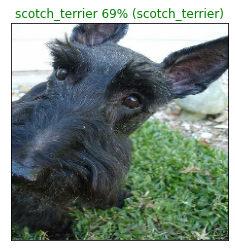

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

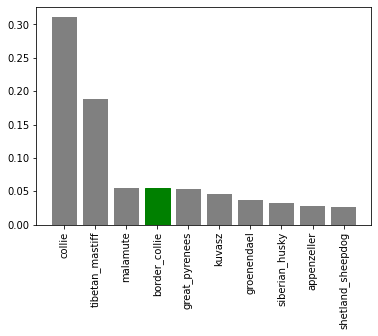

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

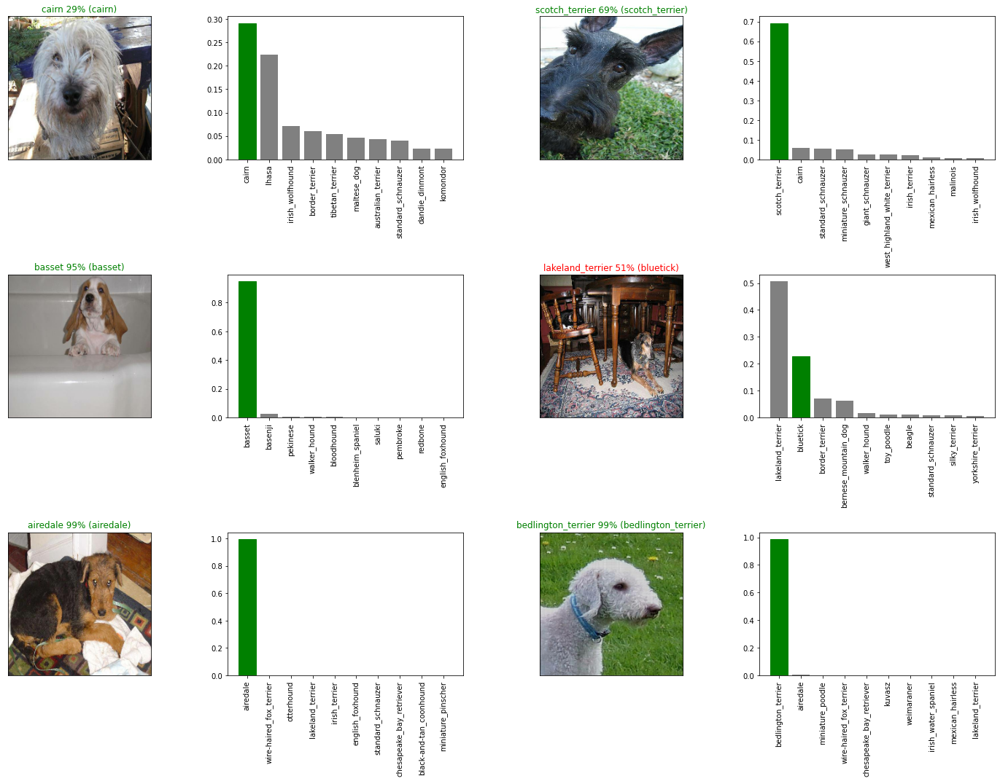

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Breeds Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/MyDrive/Dog Breeds Data/models/20221220-18141671560047-1000-images-Adam.h5...


'/content/drive/MyDrive/Dog Breeds Data/models/20221220-18141671560047-1000-images-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Breeds Data/models/20221220-03381671507487-1000-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Breeds Data/models/20221220-03381671507487-1000-images-Adam.h5


## Training a model on full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set 
full_data = create_data_batches(X, y)

Creating training data batches


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full data set
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

NameError: ignored

## Saving and reloading the full model

In [ ]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Breeds Data/models/20221220-05051671512713-all-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Breeds Data/models/20221220-05051671512713-all-images-Adam.h5


## Making predictions on the test dataset

In [ ]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = '/content/drive/MyDrive/Dog Breeds Data/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['/content/drive/MyDrive/Dog Breeds Data/test/e2c7aeef019a6577f3988a84be2b5769.jpg',
 '/content/drive/MyDrive/Dog Breeds Data/test/def9a16cb97a7cdd10d6465d642f6bf4.jpg',
 '/content/drive/MyDrive/Dog Breeds Data/test/ddf48fc0d3f0719c40332708c331a9ab.jpg',
 '/content/drive/MyDrive/Dog Breeds Data/test/e15513ca7ebb4730731f34c25e906502.jpg',
 '/content/drive/MyDrive/Dog Breeds Data/test/dea5b2d047b3cb7ce13234140c7bf5aa.jpg',
 '/content/drive/MyDrive/Dog Breeds Data/test/ddf0164ab3a269b179051bdecaea34b0.jpg',
 '/content/drive/MyDrive/Dog Breeds Data/test/dfdeddf3da8d52c211620eaabd82b773.jpg',
 '/content/drive/MyDrive/Dog Breeds Data/test/e4413cd1ee44a05cc7991ae0d097b062.jpg',
 '/content/drive/MyDrive/Dog Breeds Data/test/e3a7aeb038b8abd3f8ed910c84504efc.jpg',
 '/content/drive/MyDrive/Dog Breeds Data/test/e6c9d8058cbc9b1665aecac1ae179288.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 542s 2s/step


In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_path = "/content/drive/MyDrive/Dog Breeds Data/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2c7aeef019a6577f3988a84be2b5769,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,def9a16cb97a7cdd10d6465d642f6bf4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ddf48fc0d3f0719c40332708c331a9ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e15513ca7ebb4730731f34c25e906502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dea5b2d047b3cb7ce13234140c7bf5aa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2c7aeef019a6577f3988a84be2b5769,1.184260e-12,2.191234e-16,6.125947e-12,2.791132e-14,7.845508e-05,1.714451e-10,1.410056e-11,1.344497e-07,4.845734e-13,...,5.411422e-08,9.999041e-01,3.025586e-11,3.578417e-12,2.011743e-10,3.693332e-16,8.198698e-10,9.176354e-12,1.095854e-13,5.840136e-07
1,def9a16cb97a7cdd10d6465d642f6bf4,6.158150e-13,4.978555e-09,5.291109e-09,1.543712e-05,1.592281e-12,1.151082e-09,3.136256e-06,3.576212e-09,5.622608e-10,...,6.127449e-14,3.285402e-11,1.350886e-10,1.508523e-10,4.385747e-09,8.117913e-13,9.055090e-11,4.857307e-11,2.187013e-12,5.250584e-09
2,ddf48fc0d3f0719c40332708c331a9ab,6.957010e-07,2.387993e-08,2.632047e-09,5.003043e-09,4.405305e-08,2.455799e-10,4.061571e-08,5.669850e-09,7.897169e-07,...,6.065264e-05,1.564011e-10,4.160418e-08,5.789181e-09,7.435030e-09,1.062543e-09,1.093882e-04,3.550764e-08,1.176151e-08,4.241422e-09
3,e15513ca7ebb4730731f34c25e906502,2.825245e-09,6.967062e-07,7.992652e-11,9.489849e-10,3.124154e-10,4.493288e-12,9.036301e-13,1.119466e-10,9.463257e-14,...,4.629475e-10,4.042448e-13,2.699400e-11,1.014446e-10,2.112371e-11,3.942022e-14,3.819204e-13,3.448775e-07,3.666583e-07,5.129790e-13
4,dea5b2d047b3cb7ce13234140c7bf5aa,4.167448e-07,4.132905e-10,1.374808e-06,2.119962e-06,2.144453e-06,1.470620e-06,5.718883e-10,1.438545e-08,5.492348e-08,...,1.485633e-09,4.303411e-08,6.558499e-09,3.891393e-07,1.809627e-06,5.590988e-10,7.545397e-05,1.829798e-02,8.814150e-02,3.597918e-08


In [ ]:
preds_df.to_csv("/content/drive/MyDrive/Dog Breeds Data/full_submission_1_mobilienetV2_adam.csv",
                 index=False)